In [1]:
!pip install torch
%reload_ext autoreload
%autoreload
%matplotlib inline
import torch
import gc

In [2]:
!pip install fastai
from fastai.vision.all import *
import os
from pathlib import Path

In [3]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

In [4]:
path = Path('chest_xray')
path_hr = Path('chest_xray/images')
path_lr = Path('chest_xray/crappy')
path_reverse = Path('chest_xray/pred_reverse')
path_pred = Path('chest_xray/pred')
bs = 64

(1801, 2078)


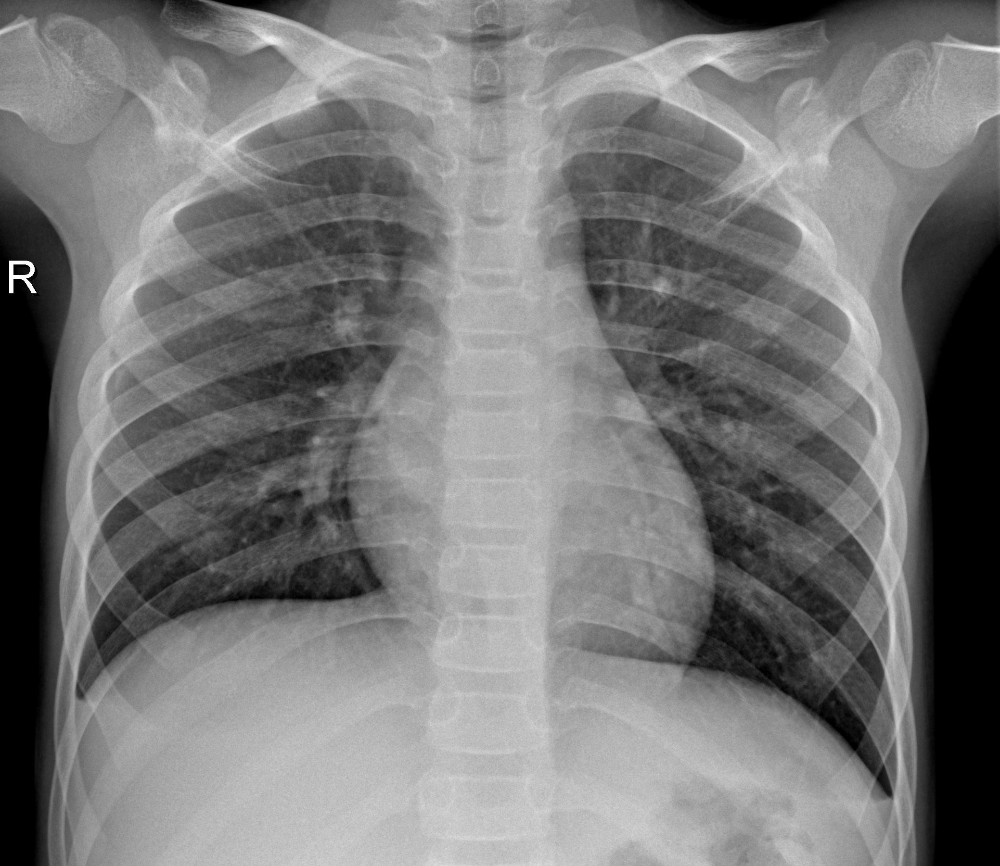

In [5]:
asda = Image.open(path_hr/'IM-0684-0001.jpeg')
print(asda.shape)
asda

In [6]:
from fastai.vision import *
import random, string
from PIL import ImageDraw, ImageFont

class crappifier(object):
    def __init__(self, path_lr, path_hr):
        self.path_lr = path_lr
        self.path_hr = path_hr              
        
    def __call__(self, fn):       
        dest = self.path_lr/fn.relative_to(self.path_hr)    
        dest.parent.mkdir(parents=True, exist_ok=True)
        img = Image.open(fn)
        font = ImageFont.truetype('arial.ttf', 80)
        img = img.resize(img.size, resample=Image.BILINEAR).convert('RGB')
        w,h = img.size
        names = []
        genders = ['M', 'F']
        with open(Path('names.txt')) as f:
            names= list(f)
        name = str(random.choice(names)) + " " + str(random.choice(names))
        ssn = random.randint(10000000000, 99999999999)
        age = "Age: " + str(random.randint(1, 150))
        sex = "Sex: " + random.choice(genders)
        data1 = str(random.randint(1, 9)) + "/" + str(9)
        data2 = "IM #:"
        data3 = "SE #:"
        data4 = "WL: W:" + str(random.randint(0,360)) + "L: " + str(random.randint(0, 360))
        q = ''.join(random.choice(string.ascii_lowercase) for i in range(random.randint(1, 8)))
        ImageDraw.Draw(img).text((0, 0), str(name), fill=(255,255,255), font=font) #first text
        ImageDraw.Draw(img).text((0, 150), str(age), fill=(255,255,255), font=font) #second text
        ImageDraw.Draw(img).text((0,300), str(sex), fill=(255,255,255), font=font) #third text
        ImageDraw.Draw(img).text((0,450), str(ssn), fill=(255,255,255), font=font) # fourth text
        ImageDraw.Draw(img).text((w//2, 0), str(name), fill=(255,255,255), font=font) #name right text
        recompute_scale_factor=True


        
        #ImageDraw.Draw(img).text((random.randint(0,w//2),random.randint(0,h//4)), str(q), fill=(255,255,255), font=font)
        #ImageDraw.Draw(img).text((0, h), str(data4), font=font) #bottom first text
        #ImageDraw.Draw(img).text((0, h-150), str(data3), font=font) #bottom second text
        #ImageDraw.Draw(img).text((0, h-300), str(data2), fill=(255,255,255), font=font) #bottom third text
        #ImageDraw.Draw(img).text((0, h-450), str(data1), fill=(255,255,255), font=font) #bottom fourth text

        img.save(dest)

In [7]:
items = get_image_files(path_hr)

In [8]:
parallel(crappifier(path_lr, path_hr), items);

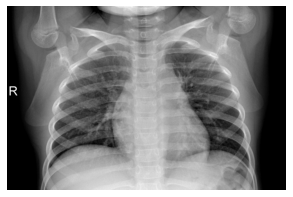

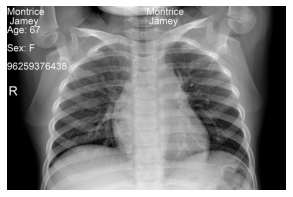

In [9]:
crap_img = get_image_files(path_lr)
im1 = PILImage.create(items[0])
im2 = PILImage.create(crap_img[0])
im1.show(); im2.show(figsize=(5,5))


In [10]:
#bs,size=32, 128
#bs,size = 24,160
#bs,size = 8, 256
arch = resnet34

In [11]:
def get_dls(bs:int, size:int):
  dblock = DataBlock(blocks=(ImageBlock, ImageBlock),
                   get_items=get_image_files,
                   get_y = lambda x: path_hr/x.name,
                   splitter=RandomSplitter(),
                   item_tfms=Resize(size = size, method = 'squish'),
                   batch_tfms=[Normalize.from_stats(*imagenet_stats)])
  dls = dblock.dataloaders(path_lr, bs=bs, path=path)
  dls.c = 3 
  return dls

In [12]:
bs,size = 8,256
dls_gen = get_dls(bs, size)


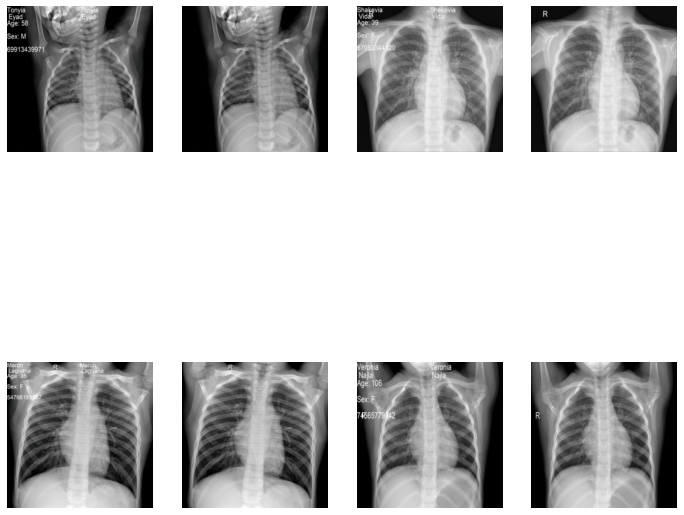

In [13]:
dls_gen.show_batch(max_n=4, figsize=(12,12))


In [29]:
from torchvision import transforms
t = image2tensor(dls_gen.dataset[0][1]) 
print(t, t.shape)
t = torch.stack([t,t])
print(t, t.shape)

tensor([[[70, 71, 72,  ..., 76, 76, 77],
         [75, 76, 76,  ..., 74, 73, 73],
         [74, 77, 78,  ..., 74, 72, 71],
         ...,
         [12, 11, 10,  ...,  0,  1,  2],
         [12, 11, 10,  ...,  0,  1,  2],
         [12, 11, 10,  ...,  0,  1,  2]],

        [[70, 71, 72,  ..., 76, 76, 77],
         [75, 76, 76,  ..., 74, 73, 73],
         [74, 77, 78,  ..., 74, 72, 71],
         ...,
         [12, 11, 10,  ...,  0,  1,  2],
         [12, 11, 10,  ...,  0,  1,  2],
         [12, 11, 10,  ...,  0,  1,  2]],

        [[70, 71, 72,  ..., 76, 76, 77],
         [75, 76, 76,  ..., 74, 73, 73],
         [74, 77, 78,  ..., 74, 72, 71],
         ...,
         [12, 11, 10,  ...,  0,  1,  2],
         [12, 11, 10,  ...,  0,  1,  2],
         [12, 11, 10,  ...,  0,  1,  2]]], dtype=torch.uint8) torch.Size([3, 931, 1198])
tensor([[[[70, 71, 72,  ..., 76, 76, 77],
          [75, 76, 76,  ..., 74, 73, 73],
          [74, 77, 78,  ..., 74, 72, 71],
          ...,
          [12, 11, 10,  ...

In [15]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [16]:
gram_matrix(t)

tensor([[[1.5242e-05, 1.5242e-05, 1.5242e-05],
         [1.5242e-05, 1.5242e-05, 1.5242e-05],
         [1.5242e-05, 1.5242e-05, 1.5242e-05]],

        [[1.5242e-05, 1.5242e-05, 1.5242e-05],
         [1.5242e-05, 1.5242e-05, 1.5242e-05],
         [1.5242e-05, 1.5242e-05, 1.5242e-05]]])

In [17]:
base_loss = F.l1_loss

In [18]:
torch.cuda.is_available()

True

In [19]:
from torchvision.models import vgg16_bn
vgg_m = vgg16_bn(True).features.cuda().eval()
vgg_m.requires_grad_ = False

In [20]:
blocks = [i-1 for i,o in enumerate(vgg_m.children()) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

In [21]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [22]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [23]:
wd = 1e-3
cfg = unet_config(blur=True, norm_type=NormType.Weight)
learn = unet_learner(dls_gen, arch, wd = wd, loss_func=feat_loss, callback_fns = LossMetrics,
                     config=cfg)

gc.collect();
sys.setrecursionlimit(10**7)

In [24]:
learn.lr_find()

RuntimeError: CUDA out of memory. Tried to allocate 2.00 MiB (GPU 0; 7.93 GiB total capacity; 6.61 GiB already allocated; 4.44 MiB free; 7.32 GiB reserved in total by PyTorch)

In [ ]:
learn.recorder.plot(suggestion=True)

In [ ]:
min_grad_lr = learn.recorder.min_grad_lr

learn.fit_one_cycle(10, min_grad_lr, pct_start=0.9)

In [ ]:
learn.show_results(rows=1, imgsize=5)

In [ ]:
learn.unfreeze()

In [ ]:
learn.fit_one_cycle(10, slice(1e-5,1e-3))

In [ ]:
learn.show_results(rows=5)

In [ ]:
learn.validate()

In [ ]:
save_preds(data.fix_dl)

In [ ]:
learn.save('256')

In [ ]:
torch.cuda.empty_cache()

In [ ]:
gc.collect()

In [ ]:
data = get_data(8, 512)

In [ ]:
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight).load('256')

In [ ]:
data.show_batch(4)

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot(suggestion=True)

In [ ]:
learn.unfreeze()

In [ ]:
learn.fit_one_cycle(10, learn.recorder.min_grad_lr)

In [ ]:
learn.save('512')

In [ ]:
learn.show_results(rows=5)

In [ ]:
gc.collect()
learn = None

In [ ]:
data=get_data(2,1024)

In [ ]:
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight).load('512')

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot(suggestion=True)

In [ ]:
learn.unfreeze()

In [ ]:
learn.fit_one_cycle(10, learn.recorder.min_grad_lr)

In [ ]:
learn.save('1024')

In [ ]:
learner.show_results(rows=5)

In [ ]:
gc.collect()
learn = None

In [ ]:
data=get_data(2,1024)
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight)

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(10, slice(1e-4, 1e-3))

In [ ]:
learn.unfreeze()

In [ ]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [ ]:
learn.fit_one_cycle(10, 1e-4)

In [ ]:
learn.show_results(rows=5)

In [ ]:
learn.validate()

In [ ]:
learn.save('fl1024')

In [ ]:
learner.load('1024')

In [ ]:
gc.collect()

In [ ]:
src = ImageImageList.from_folder(path_pred).split_by_rand_pct(0.1, seed=42)

In [ ]:
def get_data2(bs,size):
    data = (src.label_from_func(lambda x: path_lr/x.name)
           .transform( size=size, tfm_y=True, resize_method=ResizeMethod.SQUISH)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [ ]:
data = get_data2(2,1024)
data.show_batch(4)

In [ ]:
pic_preview = open_image(path_pred/'IM-0675-0001.jpeg')
pic_preview.show()

In [ ]:
#learner = create_gen_learner().load('1024')
learner = create_gen_learner()

In [ ]:
learner.lr_find()

In [ ]:
learner.recorder.plot(suggestion=True)

In [ ]:
learner.unfreeze()

In [ ]:
learner.fit_one_cycle(3, slice(1e-5,1e-2))

In [ ]:
learner.show_results(rows=5)

In [ ]:
learner.save('test_prediction')

In [ ]:
def save_preds_reverse(dl):
    i=0
    names = dl.dataset.items
    
    for b in dl:
        preds = learn.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o.save(path_flpred/names[i].name)
            i += 1

In [ ]:
save_preds_reverse(data.fix_dl)